In [33]:
import import_ipynb
import cv2
import matplotlib.pyplot as plt
import numpy as np
from search import *
from cut_score import *
from get_blue import *
from get_bowling_board import *
from get_each_number import *
from make_binary_images import *
from recognition_process import recognition

origin_image = search('./noCut')

cropped_image_save_path = './board/'

cnt = 1

# 핸드폰 카메라로 찍은 사진을 볼링 점수판만 잘라내는 과정
for data in origin_image:
    # 볼링 점수판만 잘라진 사진이 리턴됨
    cropped_image = get_bowling_board(data)
    
    # get_bowling_board 과정에서 변환된 색을 원상복구하고, 지정 크기로 저장
    cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_RGB2BGR)
    cropped_image = cv2.resize(cropped_image, (2500, 1000))
    
    fname = cropped_image_save_path + str(cnt) + '.jpg'
    cv2.imwrite(fname, cropped_image)
    cnt += 1
    
cropped_image = search('./board')
cropped_image = cropped_image[1:]

score_image_save_path = './score/'

cnt = 0

# 잘라진 볼링 점수판에서 점수만 잘라내는 과정
for data in cropped_image:
    # 하나의 점수판에서 여러개의 총 점수가 있을 수 있기 때문에, 배열 형태로 리턴됨
    scores = cut_score(data)
    index = 0
    
    for score in scores:
        score = cv2.resize(score, (200, 100))
        fname = score_image_save_path + str(cnt) + '_' + str(index) + '.jpg'
        cv2.imwrite(fname, score)
        index += 1
    cnt += 1

score_image = search('./score')
score_image = score_image[1:]

# print(score_image)

# score_image 를 2차원 배열화
score_image = make_list(score_image)
each_numbers_save_path = './numbers/'

cnt = 0
# 잘라낸 점수에서 한 자리 수 마다 숫자를 잘라내는 과정
for scores in score_image:
    first_index = 0
    for data in scores:
        last_index = 0
        
        # 각각의 점수를 이미지 배열로 리턴
        each_numbers = get_each_number(data)
        for number in each_numbers:
            fname = (each_numbers_save_path + str(cnt) + '_' + str(first_index) 
                    + '_' + str(last_index) + '.jpg')
            cv2.imwrite(fname, number)
            last_index += 1
        first_index += 1
    cnt += 1
    
    
numbers_image = search('./numbers')
numbers_image = numbers_image[1:]

# numbers_image 를 2차원 배열화
numbers_image = get_numbers_img(numbers_image)
# numbers_image 내의 숫자 이미지를 바이너리 형태로 변환하여 저장
get_binary_numbers(numbers_image)

# binary_image 를 2차원 배얄화
binary_image = search('./binary_numbers')
binary_image = binary_image[1:]
binary_image = get_numbers_img(binary_image)


index = 0
# score_image 다시 불러오기
score_image = search('./score')
score_image = score_image[1:]

# binary_image 를 하나씩 recognition 진행하여 리턴된 결과를 합쳐 이미지 이름으로 저장
for data in binary_image:
    numbers = ''
    for image in data:
        recognized_number = recognition(image)
        numbers += recognized_number
    
    image = cv2.imread(score_image[index])
    fname = './processed_image/' + numbers + '.jpg'
    cv2.imwrite(fname, image)
    
    index += 1
        

['./board\\1.jpg', './board\\10.jpg', './board\\2.jpg', './board\\3.jpg', './board\\4.jpg', './board\\5.jpg', './board\\6.jpg', './board\\7.jpg', './board\\8.jpg', './board\\9.jpg']


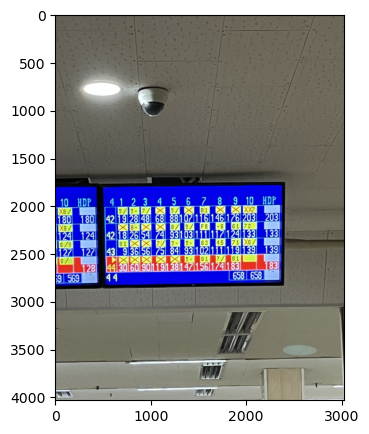

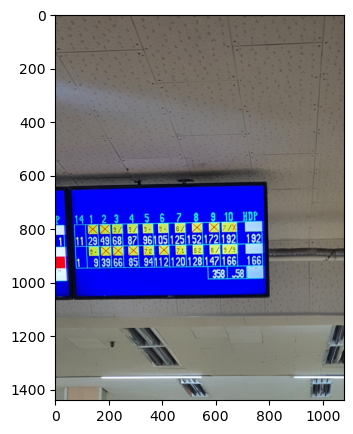

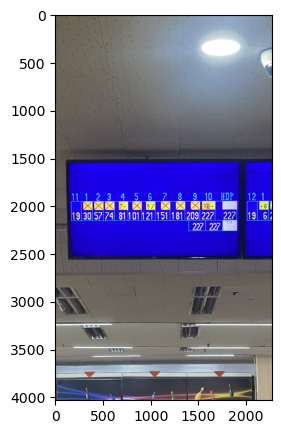

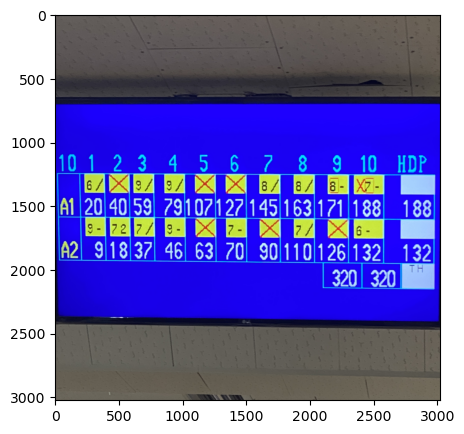

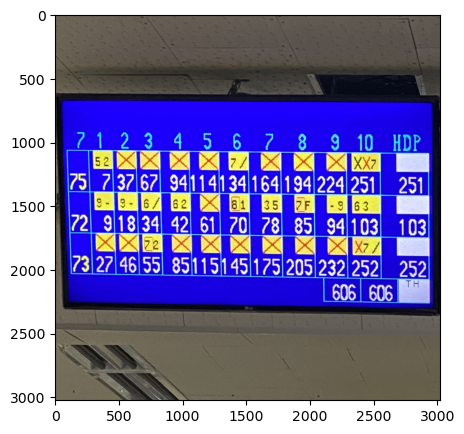

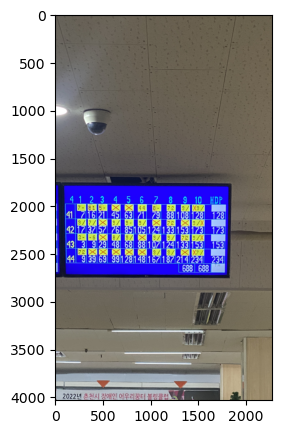

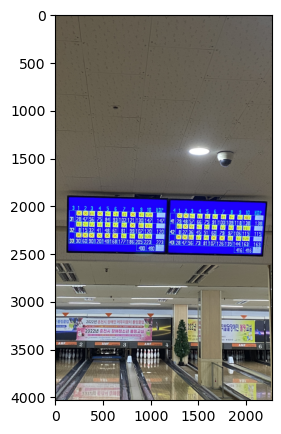

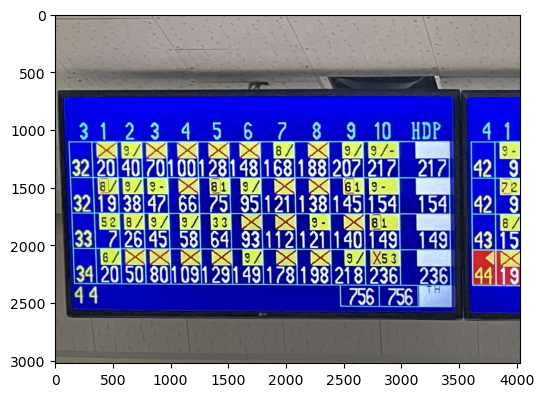

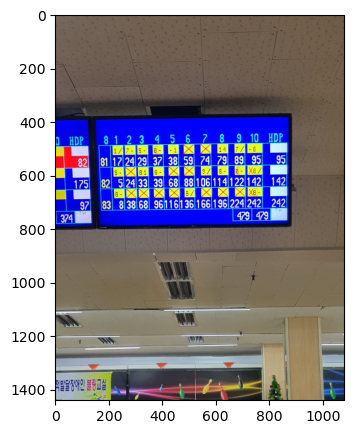

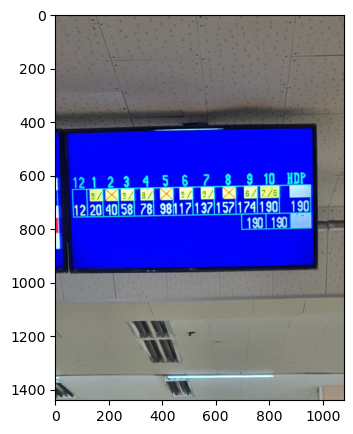

In [35]:
for data in origin_image:
    image = cv2.imread(data)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize = (6,5))
    plt.imshow(image)

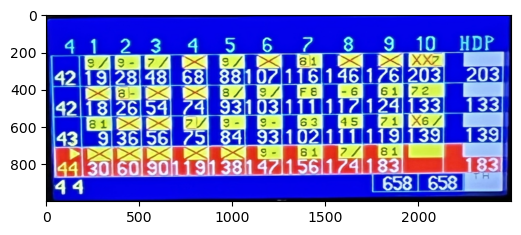

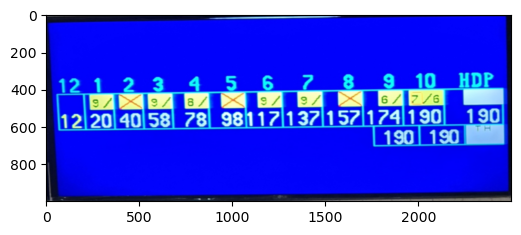

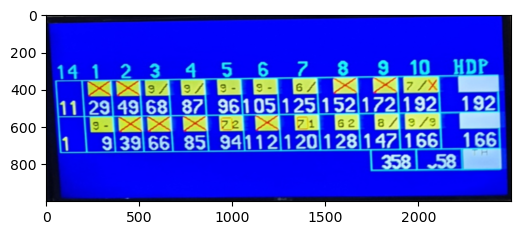

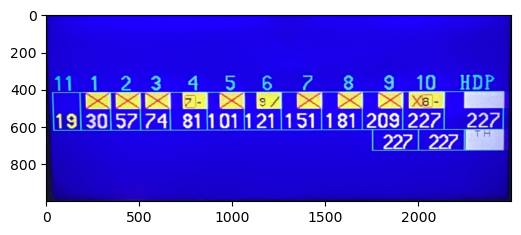

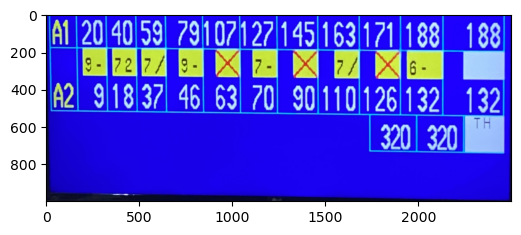

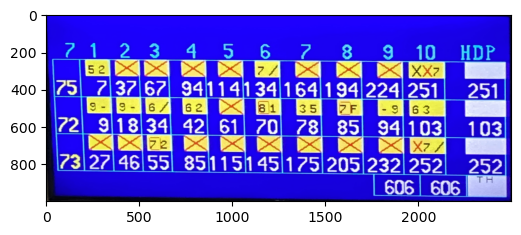

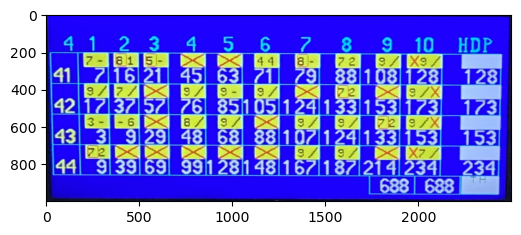

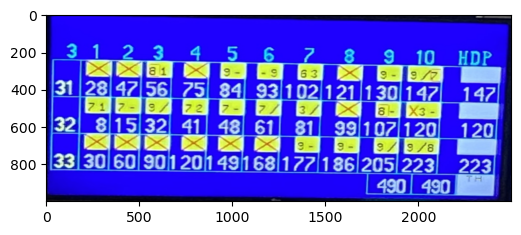

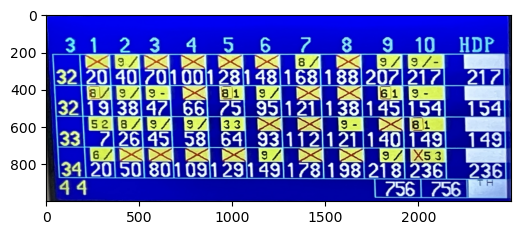

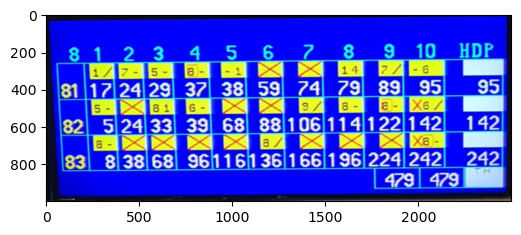

In [38]:
for data in cropped_image:
    image = cv2.imread(data)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize = (6,5))
    plt.imshow(image)

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_7296\2096947276.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (6,5))


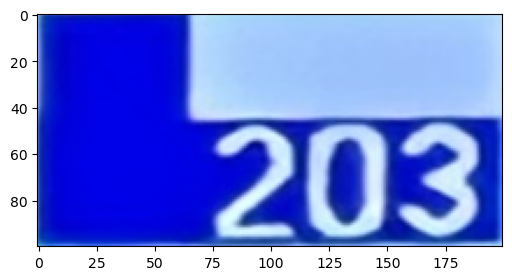

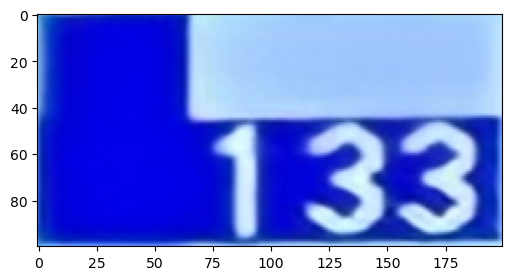

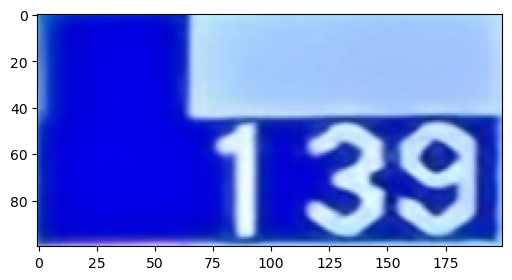

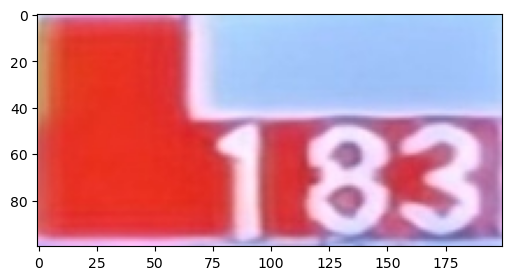

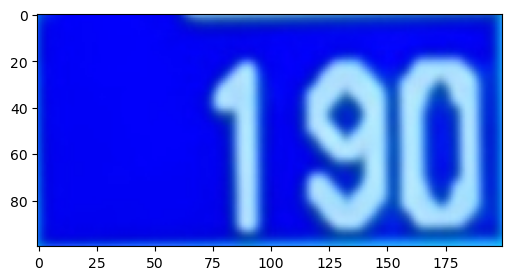

...

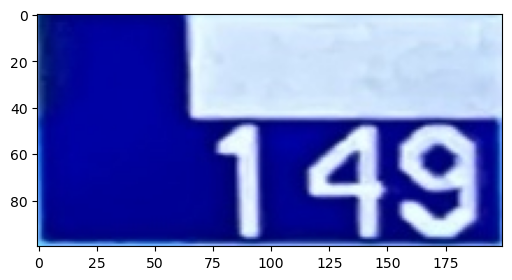

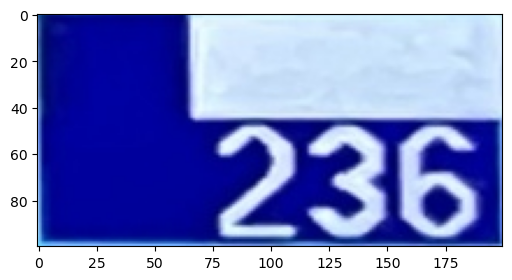

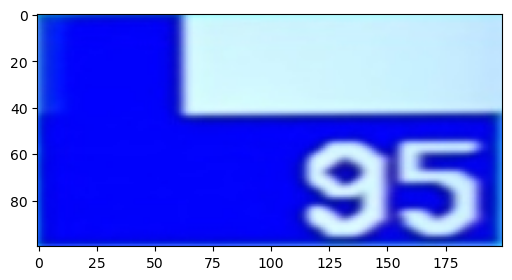

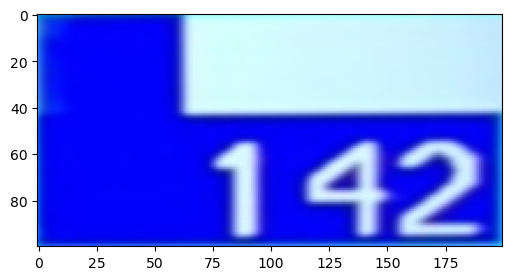

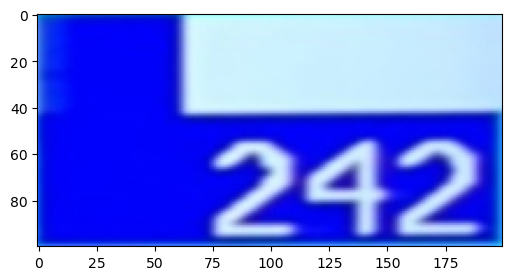

In [37]:
for data in score_image:
    image = cv2.imread(data)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize = (6,5))
    plt.imshow(image)

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_7296\1927445276.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (1,1))


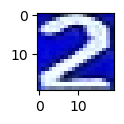

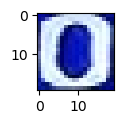

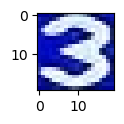

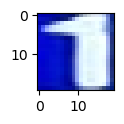

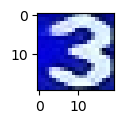

...

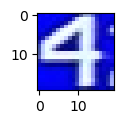

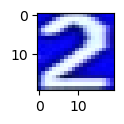

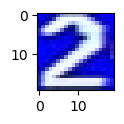

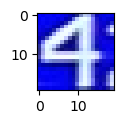

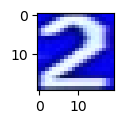

In [41]:
numbers_image = search('./numbers')[1:]
for data in numbers_image:
    image = cv2.imread(data)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize = (1,1))
    plt.imshow(image)

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_7296\749338372.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (1,1))


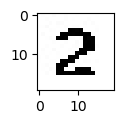

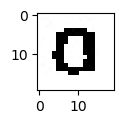

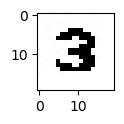

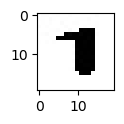

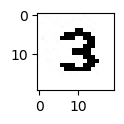

...

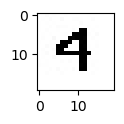

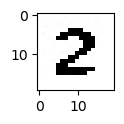

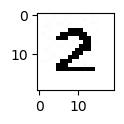

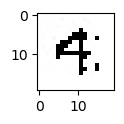

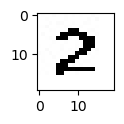

In [42]:
binary_image = search('./binary_numbers')[1:]
for data in binary_image:
    image = cv2.imread(data)
    plt.figure(figsize = (1,1))
    plt.imshow(image)

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_7296\2690952109.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(6,5))


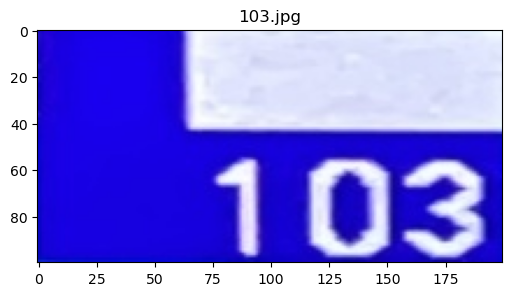

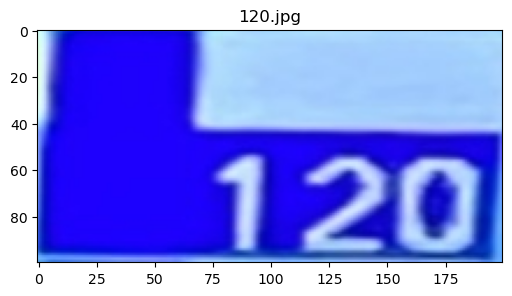

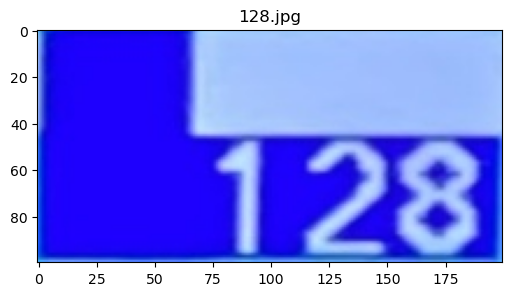

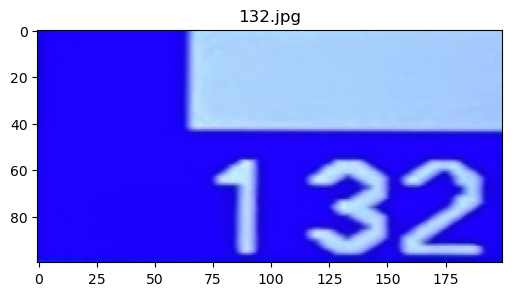

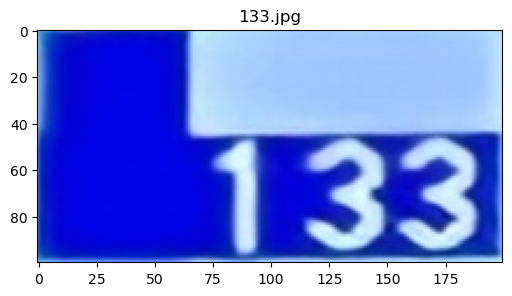

...

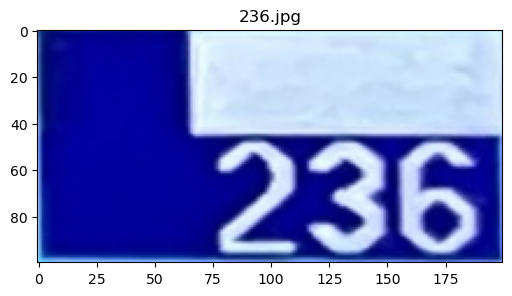

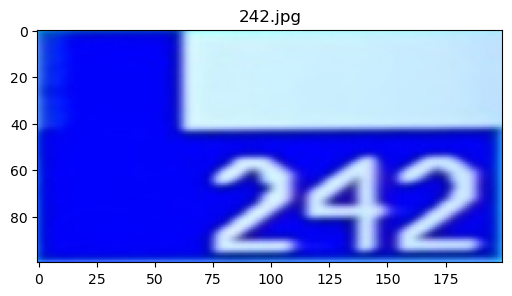

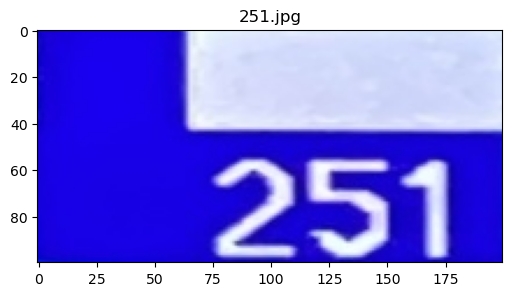

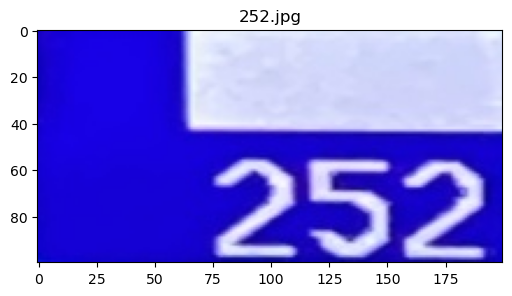

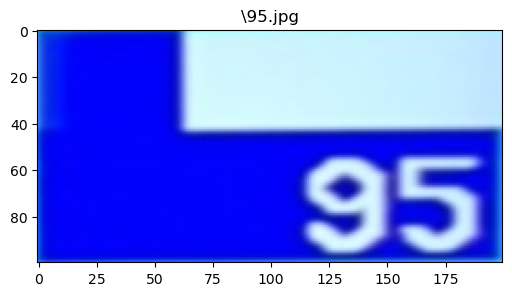

In [36]:
final_image = search('./processed_image')
final_image = final_image[1:]
for data in final_image:
    image = cv2.imread(data)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6,5))
    plt.imshow(image)
    plt.title(data[-7:])